# coco

In [1]:
!pip uninstall torch torchvision torchaudio -y

# INSTALL PyTorch with the correct CUDA version (e.g., CUDA 12.1 is common)
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121
!pip install transforms

Found existing installation: torch 2.5.1+cu121
Uninstalling torch-2.5.1+cu121:
  Successfully uninstalled torch-2.5.1+cu121
Found existing installation: torchvision 0.20.1+cu121
Uninstalling torchvision-0.20.1+cu121:
  Successfully uninstalled torchvision-0.20.1+cu121
Looking in indexes: https://download.pytorch.org/whl/cu121
  Using cached https://download.pytorch.org/whl/cu121/torch-2.5.1%2Bcu121-cp311-cp311-linux_x86_64.whl (780.5 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchvision-0.20.1%2Bcu121-cp311-cp311-linux_x86_64.whl (7.3 MB)


In [2]:
import copy
import io
from contextlib import redirect_stdout

import numpy as np
import pycocotools.mask as mask_util
import torch
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import os

import torch.utils.data
import torchvision
import torchvision.transforms as T
from pycocotools import mask as coco_mask
from pycocotools.coco import COCO


class CocoEvaluator:
    def __init__(self, coco_gt, iou_types):
        if not isinstance(iou_types, (list, tuple)):
            raise TypeError(f"This constructor expects iou_types of type list or tuple, instead  got {type(iou_types)}")
        coco_gt = copy.deepcopy(coco_gt)
        self.coco_gt = coco_gt

        self.iou_types = iou_types
        self.coco_eval = {}
        for iou_type in iou_types:
            self.coco_eval[iou_type] = COCOeval(coco_gt, iouType=iou_type)

        self.img_ids = []
        self.eval_imgs = {k: [] for k in iou_types}

    def update(self, predictions):
        img_ids = list(np.unique(list(predictions.keys())))
        self.img_ids.extend(img_ids)

        for iou_type in self.iou_types:
            results = self.prepare(predictions, iou_type)
            with redirect_stdout(io.StringIO()):
                coco_dt = COCO.loadRes(self.coco_gt, results) if results else COCO()
            coco_eval = self.coco_eval[iou_type]

            coco_eval.cocoDt = coco_dt
            coco_eval.params.imgIds = list(img_ids)
            img_ids, eval_imgs = evaluate(coco_eval)

            self.eval_imgs[iou_type].append(eval_imgs)

    def synchronize_between_processes(self):
        for iou_type in self.iou_types:
            self.eval_imgs[iou_type] = np.concatenate(self.eval_imgs[iou_type], 2)
            create_common_coco_eval(self.coco_eval[iou_type], self.img_ids, self.eval_imgs[iou_type])

    def accumulate(self):
        for coco_eval in self.coco_eval.values():
            coco_eval.accumulate()

    def summarize(self):
        for iou_type, coco_eval in self.coco_eval.items():
            print(f"IoU metric: {iou_type}")
            coco_eval.summarize()

    def prepare(self, predictions, iou_type):
        if iou_type == "bbox":
            return self.prepare_for_coco_detection(predictions)
        if iou_type == "segm":
            return self.prepare_for_coco_segmentation(predictions)
        if iou_type == "keypoints":
            return self.prepare_for_coco_keypoint(predictions)
        raise ValueError(f"Unknown iou type {iou_type}")

    def prepare_for_coco_detection(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "bbox": box,
                        "score": scores[k],
                    }
                    for k, box in enumerate(boxes)
                ]
            )
        return coco_results

    def prepare_for_coco_segmentation(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            scores = prediction["scores"]
            labels = prediction["labels"]
            masks = prediction["masks"]

            masks = masks > 0.5

            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            rles = [
                mask_util.encode(np.array(mask[0, :, :, np.newaxis], dtype=np.uint8, order="F"))[0] for mask in masks
            ]
            for rle in rles:
                rle["counts"] = rle["counts"].decode("utf-8")

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "segmentation": rle,
                        "score": scores[k],
                    }
                    for k, rle in enumerate(rles)
                ]
            )
        return coco_results

    def prepare_for_coco_keypoint(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()
            keypoints = prediction["keypoints"]
            keypoints = keypoints.flatten(start_dim=1).tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "keypoints": keypoint,
                        "score": scores[k],
                    }
                    for k, keypoint in enumerate(keypoints)
                ]
            )
        return coco_results


def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)


def merge(img_ids, eval_imgs):
    all_img_ids = all_gather(img_ids)
    all_eval_imgs = all_gather(eval_imgs)

    merged_img_ids = []
    for p in all_img_ids:
        merged_img_ids.extend(p)

    merged_eval_imgs = []
    for p in all_eval_imgs:
        merged_eval_imgs.append(p)

    merged_img_ids = np.array(merged_img_ids)
    merged_eval_imgs = np.concatenate(merged_eval_imgs, 2)

    # keep only unique (and in sorted order) images
    merged_img_ids, idx = np.unique(merged_img_ids, return_index=True)
    merged_eval_imgs = merged_eval_imgs[..., idx]

    return merged_img_ids, merged_eval_imgs


def create_common_coco_eval(coco_eval, img_ids, eval_imgs):
    img_ids, eval_imgs = merge(img_ids, eval_imgs)
    img_ids = list(img_ids)
    eval_imgs = list(eval_imgs.flatten())

    coco_eval.evalImgs = eval_imgs
    coco_eval.params.imgIds = img_ids
    coco_eval._paramsEval = copy.deepcopy(coco_eval.params)


def evaluate(imgs):
    with redirect_stdout(io.StringIO()):
        imgs.evaluate()
    return imgs.params.imgIds, np.asarray(imgs.evalImgs).reshape(-1, len(imgs.params.areaRng), len(imgs.params.imgIds))


def convert_coco_poly_to_mask(segmentations, height, width):
    masks = []
    for polygons in segmentations:
        rles = coco_mask.frPyObjects(polygons, height, width)
        mask = coco_mask.decode(rles)
        if len(mask.shape) < 3:
            mask = mask[..., None]
        mask = torch.as_tensor(mask, dtype=torch.uint8)
        mask = mask.any(dim=2)
        masks.append(mask)
    if masks:
        masks = torch.stack(masks, dim=0)
    else:
        masks = torch.zeros((0, height, width), dtype=torch.uint8)
    return masks


class ConvertCocoPolysToMask:
    def __call__(self, image, target):
        w, h = image.size

        image_id = target["image_id"]

        anno = target["annotations"]

        anno = [obj for obj in anno if obj["iscrowd"] == 0]

        boxes = [obj["bbox"] for obj in anno]
        # guard against no boxes via resizing
        boxes = torch.as_tensor(boxes, dtype=torch.float32).reshape(-1, 4)
        boxes[:, 2:] += boxes[:, :2]
        boxes[:, 0::2].clamp_(min=0, max=w)
        boxes[:, 1::2].clamp_(min=0, max=h)

        classes = [obj["category_id"] for obj in anno]
        classes = torch.tensor(classes, dtype=torch.int64)

        segmentations = [obj["segmentation"] for obj in anno]
        masks = convert_coco_poly_to_mask(segmentations, h, w)

        keypoints = None
        if anno and "keypoints" in anno[0]:
            keypoints = [obj["keypoints"] for obj in anno]
            keypoints = torch.as_tensor(keypoints, dtype=torch.float32)
            num_keypoints = keypoints.shape[0]
            if num_keypoints:
                keypoints = keypoints.view(num_keypoints, -1, 3)

        keep = (boxes[:, 3] > boxes[:, 1]) & (boxes[:, 2] > boxes[:, 0])
        boxes = boxes[keep]
        classes = classes[keep]
        masks = masks[keep]
        if keypoints is not None:
            keypoints = keypoints[keep]

        target = {}
        target["boxes"] = boxes
        target["labels"] = classes
        target["masks"] = masks
        target["image_id"] = image_id
        if keypoints is not None:
            target["keypoints"] = keypoints

        # for conversion to coco api
        area = torch.tensor([obj["area"] for obj in anno])
        iscrowd = torch.tensor([obj["iscrowd"] for obj in anno])
        target["area"] = area
        target["iscrowd"] = iscrowd

        return image, target


def _coco_remove_images_without_annotations(dataset, cat_list=None):
    def _has_only_empty_bbox(anno):
        return all(any(o <= 1 for o in obj["bbox"][2:]) for obj in anno)

    def _count_visible_keypoints(anno):
        return sum(sum(1 for v in ann["keypoints"][2::3] if v > 0) for ann in anno)

    min_keypoints_per_image = 10

    def _has_valid_annotation(anno):
        # if it's empty, there is no annotation
        if len(anno) == 0:
            return False
        # if all boxes have close to zero area, there is no annotation
        if _has_only_empty_bbox(anno):
            return False
        # keypoints task have a slight different criteria for considering
        # if an annotation is valid
        if "keypoints" not in anno[0]:
            return True
        # for keypoint detection tasks, only consider valid images those
        # containing at least min_keypoints_per_image
        if _count_visible_keypoints(anno) >= min_keypoints_per_image:
            return True
        return False

    ids = []
    for ds_idx, img_id in enumerate(dataset.ids):
        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, iscrowd=None)
        anno = dataset.coco.loadAnns(ann_ids)
        if cat_list:
            anno = [obj for obj in anno if obj["category_id"] in cat_list]
        if _has_valid_annotation(anno):
            ids.append(ds_idx)

    dataset = torch.utils.data.Subset(dataset, ids)
    return dataset


def convert_to_coco_api(ds):
    coco_ds = COCO()
    # annotation IDs need to start at 1, not 0, see torchvision issue #1530
    ann_id = 1
    dataset = {"images": [], "categories": [], "annotations": [], "info": {}}
    categories = set()
    for img_idx in range(len(ds)):
        # find better way to get target
        # targets = ds.get_annotations(img_idx)
        img, targets = ds[img_idx]
        image_id = targets["image_id"]
        img_dict = {}
        img_dict["id"] = image_id
        img_dict["height"] = img.shape[-2]
        img_dict["width"] = img.shape[-1]
        dataset["images"].append(img_dict)
        bboxes = targets["boxes"].clone()
        bboxes[:, 2:] -= bboxes[:, :2]
        bboxes = bboxes.tolist()
        labels = targets["labels"].tolist()
        areas = targets["area"].tolist()
        iscrowd = targets["iscrowd"].tolist()
        if "masks" in targets:
            masks = targets["masks"]
            # make masks Fortran contiguous for coco_mask
            masks = masks.permute(0, 2, 1).contiguous().permute(0, 2, 1)
        if "keypoints" in targets:
            keypoints = targets["keypoints"]
            keypoints = keypoints.reshape(keypoints.shape[0], -1).tolist()
        num_objs = len(bboxes)
        for i in range(num_objs):
            ann = {}
            ann["image_id"] = image_id
            ann["bbox"] = bboxes[i]
            ann["category_id"] = labels[i]
            categories.add(labels[i])
            ann["area"] = areas[i]
            ann["iscrowd"] = iscrowd[i]
            ann["id"] = ann_id
            if "masks" in targets:
                ann["segmentation"] = coco_mask.encode(masks[i].numpy())
            if "keypoints" in targets:
                ann["keypoints"] = keypoints[i]
                ann["num_keypoints"] = sum(k != 0 for k in keypoints[i][2::3])
            dataset["annotations"].append(ann)
            ann_id += 1
    dataset["categories"] = [{"id": i} for i in sorted(categories)]
    coco_ds.dataset = dataset
    coco_ds.createIndex()
    return coco_ds


def get_coco_api_from_dataset(dataset):
    # FIXME: This is... awful?
    for _ in range(10):
        if isinstance(dataset, torchvision.datasets.CocoDetection):
            break
        if isinstance(dataset, torch.utils.data.Subset):
            dataset = dataset.dataset
    if isinstance(dataset, torchvision.datasets.CocoDetection):
        return dataset.coco
    return convert_to_coco_api(dataset)


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, ann_file, transforms):
        super().__init__(img_folder, ann_file)
        self._transforms = transforms

    def __getitem__(self, idx):
        img, target = super().__getitem__(idx)
        image_id = self.ids[idx]
        target = dict(image_id=image_id, annotations=target)
        if self._transforms is not None:
            img, target = self._transforms(img, target)
        return img, target


def get_coco(root, image_set, transforms, mode="instances", use_v2=False, with_masks=False):
    anno_file_template = "{}_{}2017.json"
    PATHS = {
        "train": ("train2017", os.path.join("annotations", anno_file_template.format(mode, "train"))),
        "val": ("val2017", os.path.join("annotations", anno_file_template.format(mode, "val"))),
        # "train": ("val2017", os.path.join("annotations", anno_file_template.format(mode, "val")))
    }

    img_folder, ann_file = PATHS[image_set]
    img_folder = os.path.join(root, img_folder)
    ann_file = os.path.join(root, ann_file)

    if use_v2:
        from torchvision.datasets import wrap_dataset_for_transforms_v2

        dataset = torchvision.datasets.CocoDetection(img_folder, ann_file, transforms=transforms)
        target_keys = ["boxes", "labels", "image_id"]
        if with_masks:
            target_keys += ["masks"]
        dataset = wrap_dataset_for_transforms_v2(dataset, target_keys=target_keys)
    else:
        # TODO: handle with_masks for V1?
        t = [ConvertCocoPolysToMask()]
        if transforms is not None:
            t.append(transforms)
        transforms = T.Compose(t)

        dataset = CocoDetection(img_folder, ann_file, transforms=transforms)

    if image_set == "train":
        dataset = _coco_remove_images_without_annotations(dataset)

    # dataset = torch.utils.data.Subset(dataset, [i for i in range(500)])

    return dataset


# Utils

In [3]:
import datetime
import errno
import os
import time
from collections import defaultdict, deque

import torch
import torch.distributed as dist


class SmoothedValue:
    """Track a series of values and provide access to smoothed values over a
    window or the global series average.
    """

    def __init__(self, window_size=20, fmt=None):
        if fmt is None:
            fmt = "{median:.4f} ({global_avg:.4f})"
        self.deque = deque(maxlen=window_size)
        self.total = 0.0
        self.count = 0
        self.fmt = fmt

    def update(self, value, n=1):
        self.deque.append(value)
        self.count += n
        self.total += value * n

    def synchronize_between_processes(self):
        """
        Warning: does not synchronize the deque!
        """
        if not is_dist_avail_and_initialized():
            return
        t = torch.tensor([self.count, self.total], dtype=torch.float64, device="cuda")
        dist.barrier()
        dist.all_reduce(t)
        t = t.tolist()
        self.count = int(t[0])
        self.total = t[1]

    @property
    def median(self):
        d = torch.tensor(list(self.deque))
        return d.median().item()

    @property
    def avg(self):
        d = torch.tensor(list(self.deque), dtype=torch.float32)
        return d.mean().item()

    @property
    def global_avg(self):
        return self.total / self.count

    @property
    def max(self):
        return max(self.deque)

    @property
    def value(self):
        return self.deque[-1]

    def __str__(self):
        return self.fmt.format(
            median=self.median, avg=self.avg, global_avg=self.global_avg, max=self.max, value=self.value
        )


def all_gather(data):
    """
    Run all_gather on arbitrary picklable data (not necessarily tensors)
    Args:
        data: any picklable object
    Returns:
        list[data]: list of data gathered from each rank
    """
    world_size = get_world_size()
    if world_size == 1:
        return [data]
    data_list = [None] * world_size
    dist.all_gather_object(data_list, data)
    return data_list


def reduce_dict(input_dict, average=True):
    """
    Args:
        input_dict (dict): all the values will be reduced
        average (bool): whether to do average or sum
    Reduce the values in the dictionary from all processes so that all processes
    have the averaged results. Returns a dict with the same fields as
    input_dict, after reduction.
    """
    world_size = get_world_size()
    if world_size < 2:
        return input_dict
    with torch.inference_mode():
        names = []
        values = []
        # sort the keys so that they are consistent across processes
        for k in sorted(input_dict.keys()):
            names.append(k)
            values.append(input_dict[k])
        values = torch.stack(values, dim=0)
        dist.all_reduce(values)
        if average:
            values /= world_size
        reduced_dict = {k: v for k, v in zip(names, values)}
    return reduced_dict


class MetricLogger:
    def __init__(self, delimiter="\t"):
        self.meters = defaultdict(SmoothedValue)
        self.delimiter = delimiter

    def update(self, **kwargs):
        for k, v in kwargs.items():
            if isinstance(v, torch.Tensor):
                v = v.item()
            assert isinstance(v, (float, int))
            self.meters[k].update(v)

    def __getattr__(self, attr):
        if attr in self.meters:
            return self.meters[attr]
        if attr in self.__dict__:
            return self.__dict__[attr]
        raise AttributeError(f"'{type(self).__name__}' object has no attribute '{attr}'")

    def __str__(self):
        loss_str = []
        for name, meter in self.meters.items():
            loss_str.append(f"{name}: {str(meter)}")
        return self.delimiter.join(loss_str)

    def synchronize_between_processes(self):
        for meter in self.meters.values():
            meter.synchronize_between_processes()

    def add_meter(self, name, meter):
        self.meters[name] = meter

    def log_every(self, iterable, print_freq, header=None):
        i = 0
        if not header:
            header = ""
        start_time = time.time()
        end = time.time()
        iter_time = SmoothedValue(fmt="{avg:.4f}")
        data_time = SmoothedValue(fmt="{avg:.4f}")
        space_fmt = ":" + str(len(str(len(iterable)))) + "d"
        if torch.cuda.is_available():
            log_msg = self.delimiter.join(
                [
                    header,
                    "[{0" + space_fmt + "}/{1}]",
                    "eta: {eta}",
                    "{meters}",
                    "time: {time}",
                    "data: {data}",
                    "max mem: {memory:.0f}",
                ]
            )
        else:
            log_msg = self.delimiter.join(
                [header, "[{0" + space_fmt + "}/{1}]", "eta: {eta}", "{meters}", "time: {time}", "data: {data}"]
            )
        MB = 1024.0 * 1024.0
        for obj in iterable:
            data_time.update(time.time() - end)
            yield obj
            iter_time.update(time.time() - end)
            if i % print_freq == 0 or i == len(iterable) - 1:
                eta_seconds = iter_time.global_avg * (len(iterable) - i)
                eta_string = str(datetime.timedelta(seconds=int(eta_seconds)))
                if torch.cuda.is_available():
                    print(
                        log_msg.format(
                            i,
                            len(iterable),
                            eta=eta_string,
                            meters=str(self),
                            time=str(iter_time),
                            data=str(data_time),
                            memory=torch.cuda.max_memory_allocated() / MB,
                        )
                    )
                else:
                    print(
                        log_msg.format(
                            i, len(iterable), eta=eta_string, meters=str(self), time=str(iter_time), data=str(data_time)
                        )
                    )
            i += 1
            end = time.time()
        total_time = time.time() - start_time
        total_time_str = str(datetime.timedelta(seconds=int(total_time)))
        print(f"{header} Total time: {total_time_str} ({total_time / len(iterable):.4f} s / it)")


def collate_fn(batch):
    return tuple(zip(*batch))


def mkdir(path):
    try:
        os.makedirs(path)
    except OSError as e:
        if e.errno != errno.EEXIST:
            raise


def setup_for_distributed(is_master):
    """
    This function disables printing when not in master process
    """
    import builtins as __builtin__

    builtin_print = __builtin__.print

    def print(*args, **kwargs):
        force = kwargs.pop("force", False)
        if is_master or force:
            builtin_print(*args, **kwargs)

    __builtin__.print = print


def is_dist_avail_and_initialized():
    if not dist.is_available():
        return False
    if not dist.is_initialized():
        return False
    return True


def get_world_size():
    if not is_dist_avail_and_initialized():
        return 1
    return dist.get_world_size()


def get_rank():
    if not is_dist_avail_and_initialized():
        return 0
    return dist.get_rank()


def is_main_process():
    return get_rank() == 0


def save_on_master(*args, **kwargs):
    if is_main_process():
        torch.save(*args, **kwargs)


def init_distributed_mode(args):
    if "RANK" in os.environ and "WORLD_SIZE" in os.environ:
        args.rank = int(os.environ["RANK"])
        args.world_size = int(os.environ["WORLD_SIZE"])
        args.gpu = int(os.environ["LOCAL_RANK"])
    elif "SLURM_PROCID" in os.environ:
        args.rank = int(os.environ["SLURM_PROCID"])
        args.gpu = args.rank % torch.cuda.device_count()
    else:
        print("Not using distributed mode")
        args.distributed = False
        return

    args.distributed = True

    torch.cuda.set_device(args.gpu)
    args.dist_backend = "nccl"
    print(f"| distributed init (rank {args.rank}): {args.dist_url}", flush=True)
    torch.distributed.init_process_group(
        backend=args.dist_backend, init_method=args.dist_url, world_size=args.world_size, rank=args.rank
    )
    torch.distributed.barrier()
    setup_for_distributed(args.rank == 0)


# Engine

In [4]:
import math
import os
import sys
import time
import copy
import matplotlib.pyplot as plt
import torch
import pandas as pd
import itertools
import torchvision.models.detection.mask_rcnn

import numpy as np
from sklearn.model_selection import KFold
from torch.utils.data import Subset
from tqdm.auto import tqdm

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq, scaler=None):
    model.train()
    metric_logger = MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", SmoothedValue(window_size=1, fmt="{value:.6f}"))

    pbar = tqdm(data_loader, desc=f"Epoch {epoch+1} Train", leave=False, total=len(data_loader))
    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1.0 / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = torch.optim.lr_scheduler.LinearLR(
            optimizer, start_factor=warmup_factor, total_iters=warmup_iters
        )
    
    # --- Metrics for TQDM ---
    avg_loss = SmoothedValue(window_size=print_freq, fmt="{value:.4f}")
    avg_lr = SmoothedValue(window_size=1, fmt="{value:.6f}")
    epoch_lrs = []
    epoch_losses = []

    # metric_logger.log_every(data_loader, print_freq, header)
    for images, targets in pbar:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]
        with torch.amp.autocast('cuda', enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = reduce_dict(loss_dict)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()

        if not math.isfinite(loss_value):
            print(f"Loss is {loss_value}, stopping training")
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()
        
        # --- Update and display TQDM postfix metrics ---
        avg_loss.update(losses_reduced.item())
        avg_lr.update(optimizer.param_groups[0]["lr"])
        
        # Format the loss dictionary for display
        loss_str = ", ".join([f"{k}: {v.item():.4f}" for k, v in loss_dict_reduced.items()])
        
        pbar.set_postfix(loss=avg_loss.fmt.format(value=avg_loss.avg), 
                         lr=avg_lr.fmt.format(value=avg_lr.avg),
                         raw_losses=f"({loss_str})")

    return epoch_lrs, epoch_losses

def _get_iou_types(model):
    model_without_ddp = model
    if isinstance(model, torch.nn.parallel.DistributedDataParallel):
        model_without_ddp = model.module
    iou_types = ["bbox"]
    if isinstance(model_without_ddp, torchvision.models.detection.MaskRCNN):
        iou_types.append("segm")
    if isinstance(model_without_ddp, torchvision.models.detection.KeypointRCNN):
        iou_types.append("keypoints")
    return iou_types


@torch.inference_mode()
def run_evaluation(model, data_loader, device, initial_cm):
    n_threads = torch.get_num_threads()
    # FIXME remove this and make paste_masks_in_image run on the GPU
    torch.set_num_threads(1)
    cpu_device = torch.device("cpu")
    model.eval()
    # metric_logger = utils.MetricLogger(delimiter="  ")
    # Use tqdm to wrap the data_loader for evaluation

    pbar = tqdm(data_loader, desc=f"Evaluation", leave=False, total=len(data_loader))

    coco = get_coco_api_from_dataset(data_loader.dataset)
    iou_types = _get_iou_types(model)
    coco_evaluator = CocoEvaluator(coco, iou_types)

    confusion_matrix_data = initial_cm.copy()

    # --- Metrics for TQDM ---
    avg_model_time = SmoothedValue(window_size=pbar.miniters, fmt="{avg:.3f}s")
    avg_eval_time = SmoothedValue(window_size=pbar.miniters, fmt="{avg:.3f}s")

    for images, targets in pbar:
        images = list(img.to(device) for img in images)

        if torch.cuda.is_available():
            torch.cuda.synchronize()
        model_time = time.time()
        outputs = model(images)

        outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
        model_time = time.time() - model_time

        res = {target["image_id"]: output for target, output in zip(targets, outputs)}
        evaluator_time = time.time()
        coco_evaluator.update(res)
        confusion_matrix_data = update_confusion_matrix(
            confusion_matrix_data, targets, outputs, num_classes=MATRIX_SIZE
        )
        evaluator_time = time.time() - evaluator_time
        # --- Update and display TQDM postfix metrics ---
        avg_model_time.update(model_time)
        avg_eval_time.update(evaluator_time)
        
        pbar.set_postfix(model_t=avg_model_time.fmt.format(avg=avg_model_time.avg),
                         eval_t=avg_eval_time.fmt.format(avg=avg_eval_time.avg))

    coco_evaluator.synchronize_between_processes()

    # accumulate predictions from all images
    coco_evaluator.accumulate()
    coco_evaluator.summarize()
    torch.set_num_threads(n_threads)
    return coco_evaluator, confusion_matrix_data.copy().astype(np.int32), 

class Args:
    def __init__(self):
        self.k_folds = 3
        self.epochs = 3 # Number of epochs PER FOLD
        self.num_classes = 6 # Background + 3 classes
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.batch_size = 4
        self.workers = 0
        self.lr = 0.02
        self.momentum = 0.9
        self.weight_decay = 1e-4
        self.print_freq = 50
        self.amp = False
        self.seed = 42
        self.data_path = './data'

def kfold_train(args, model, dataset):
    torch.manual_seed(args.seed)
    np.random.seed(args.seed)
    
    device = torch.device(args.device)
    indices = torch.arange(len(dataset)).tolist()
    kf = KFold(n_splits=args.k_folds, shuffle=True, random_state=args.seed) 
    
    MATRIX_SIZE = args.num_classes # Or whatever size you use (e.g., 6)
    
    # Initialize the blank confusion matrix data
    initial_cm_data = np.zeros((MATRIX_SIZE, MATRIX_SIZE), dtype=np.int32)
    
    all_fold_evaluators = []
    kfold_data = {'summary': {}, 'history': {}}

    for fold, (train_indices, val_indices) in enumerate(kf.split(indices)):
        print(f"\n{'='*20} Start Fold {fold+1}/{args.k_folds} {'='*20}")

        dataset_train = Subset(dataset, train_indices)
        dataset_val = Subset(dataset, val_indices)
        
        train_data_loader = torch.utils.data.DataLoader(
            dataset_train, batch_size=args.batch_size, shuffle=True, 
            num_workers=args.workers, collate_fn=collate_fn 
        )
        val_data_loader = torch.utils.data.DataLoader(
            dataset_val, batch_size=args.batch_size * 2, shuffle=False,
            num_workers=args.workers, collate_fn=collate_fn
        )

        model.to(device)
        
        params = [p for p in model.parameters() if p.requires_grad]
        optimizer = torch.optim.SGD(
            params, lr=args.lr, momentum=args.momentum, weight_decay=args.weight_decay
        )
        
        scaler = torch.amp.GradScaler('cuda') if args.amp else None

        fold_lrs = []
        fold_losses = []
        
        best_map = -1.0
        best_evaluator = None
        best_metrics = {}

        for epoch in range(args.epochs):
            print(f"\n--- Fold {fold+1}, Epoch {epoch+1}/{args.epochs} ---")

            epoch_lrs, epoch_losses = train_one_epoch(
                model, optimizer, train_data_loader, device, epoch, args.print_freq, scaler
            )

            fold_lrs.extend(epoch_lrs)
            fold_losses.extend(epoch_losses)

            print("Running Evaluation...")
            fold_lrs.extend(epoch_lrs)
            fold_losses.extend(epoch_losses)
            coco_evaluator, initial_cm_data = run_evaluation(model=model, data_loader=val_data_loader, device=device, initial_cm=initial_cm_data)
            
            current_map = coco_evaluator.coco_eval['bbox'].stats[0] 
            
            if current_map > best_map:
                best_map = current_map
                best_evaluator = copy.deepcopy(coco_evaluator)
                best_metrics = extract_coco_metrics(coco_evaluator) 

        print(f"\nFold {fold+1} finished. Best mAP: {best_map:.4f}")

        if best_evaluator:
            all_fold_evaluators.append(best_evaluator)
            kfold_data['summary'][f'Fold {fold+1}'] = best_metrics
            kfold_data['history'][f'Fold {fold+1}'] = {'lrs': fold_lrs, 'losses': fold_losses}
            
    print(f"\n\n{'='*20} K-Fold Summary (N={args.k_folds}) {'='*20}")
    
    if kfold_data['summary']:
        maps = [d['mAP50-95'] for d in kfold_data['summary'].values()] # Use mAP50-95 for overall mean
        mean_map = np.mean(maps)
        std_map = np.std(maps)
        
        print("\nIndividual Fold Results:")
        for k, v in kfold_data['summary'].items():
            print(f"- {k} (mAP50-95): {v['mAP50-95']:.4f}")
        
        print(f"\n--- Final Cross-Validation Result ---")
        print(f"Mean Best mAP: {mean_map:.4f} \u00B1 {std_map:.4f}")
        
        for i, evaluator in enumerate(all_fold_evaluators):
            print(f"--- Full Summary for Fold {i+1} ---")
            evaluator.summarize()

    return kfold_data
# Helper function to get the mAP and AR metrics from CocoEvaluator
def extract_coco_metrics(coco_evaluator, iou_type='bbox'):
    """Extracts key COCO metrics from a CocoEvaluator object."""
    stats = coco_evaluator.coco_eval[iou_type].stats

    AP50 = stats[1]
    AR100 = stats[8] # AR @ maxDets=100
    
    # Simplified F1-score placeholder (F1 is not standard COCO output):
    f1_proxy = (2 * AP50 * AR100) / (AP50 + AR100) if (AP50 + AR100) > 0 else 0 

    metrics = {
        'mAP50-95': stats[0],
        'mAP50': stats[1],
        'mAP75': stats[2],
        'AR100': stats[8],
        'f1_score': f1_proxy
    }
    return metrics

def plot_graph_kfold(kfold_data: dict):
    summary_df = pd.DataFrame.from_dict(kfold_data['summary'], orient='index')
    summary_df.index = [i for i in range(1, len(summary_df) + 1)] 
    summary_df.index.name = 'Fold'

    print("\n--- K-Fold Metrics Summary ---")
    print(summary_df)

    mean_metrics = summary_df.mean()
    std_metrics = summary_df.std()

    print("\n--- Average Metrics ---")
    print(f"Mean mAP50: {mean_metrics['mAP50']:.4f} +/- {std_metrics['mAP50']:.4f}")
    print(f"Mean mAP50-95: {mean_metrics['mAP50-95']:.4f} +/- {std_metrics['mAP50-95']:.4f}")


    # 3. Plotting the mAP50 results per fold
    plt.figure(figsize=(10, 6))

    summary_df['mAP50'].plot(
        kind='bar', 
        capsize=5, 
        color='skyblue'
    )

    # Draw a line for the average mAP50
    plt.axhline(mean_metrics['mAP50'], color='red', linestyle='--', label=f'Average mAP50: {mean_metrics["mAP50"]:.4f}')

    plt.title('Validation mAP@0.5 Across K-Folds')
    plt.xlabel('Fold Number')
    plt.ylabel('mAP@0.5')
    plt.xticks(rotation=0)
    plt.legend()
    plt.grid(axis='y', linestyle=':')
    plt.tight_layout()
    SAVE_FILE_NAME_1 = 'kfold_map50_results.png'
    plt.savefig(SAVE_FILE_NAME_1) 
    print(f"\nPlot saved successfully as: {os.path.abspath(SAVE_FILE_NAME_1)}")


    # --- PLOT 2: mAP@0.5:0.95 (New Plot) ---
    plt.figure(figsize=(10, 6))

    summary_df['mAP50-95'].plot(
        kind='bar', 
        capsize=5, 
        color='lightcoral' # Use a different color
    )

    # Draw a line for the average mAP50-95
    plt.axhline(mean_metrics['mAP50-95'], color='darkred', linestyle='--', label=f'Average mAP50-95: {mean_metrics["mAP50-95"]:.4f}')

    plt.title('Validation mAP@0.5:0.95 Across K-Folds')
    plt.xlabel('Fold Number')
    plt.ylabel('mAP@0.5:0.95')
    plt.xticks(rotation=0)
    plt.legend()
    plt.grid(axis='y', linestyle=':')
    plt.tight_layout()
    SAVE_FILE_NAME_2 = 'kfold_map50-95_results.png'
    plt.savefig(SAVE_FILE_NAME_2) 
    print(f"\nPlot saved successfully as: {os.path.abspath(SAVE_FILE_NAME_2)}")

    # --- PLOT 3: F1 Score ---
    plt.figure(figsize=(10, 6))

    summary_df['f1_score'].plot(
        kind='bar', 
        capsize=5, 
        color='darkgreen' # New color for F1 score
    )

    # Draw a line for the average F1 Score
    plt.axhline(mean_metrics['f1_score'], color='blue', linestyle='--', label=f'Average F1 Score: {mean_metrics["f1_score"]:.4f}')

    plt.title('Validation F1 Score Across K-Folds')
    plt.xlabel('Fold Number')
    plt.ylabel('F1 Score')
    plt.xticks(rotation=0)
    plt.legend()
    plt.grid(axis='y', linestyle=':')
    plt.tight_layout()
    SAVE_FILE_NAME_3 = 'kfold_f1_score_results.png'
    plt.savefig(SAVE_FILE_NAME_3) 
    print(f"Plot saved successfully as: {os.path.abspath(SAVE_FILE_NAME_3)}")

    plt.show()
def plot_learning_rate_all_folds(kfold_data: dict):
    """Plots the Learning Rate history for ALL folds on a single graph."""
    if 'history' not in kfold_data:
        print("Error: History data not found in kfold_data.")
        return

    plt.figure(figsize=(12, 6))
    
    for fold_name, history in kfold_data['history'].items():
        lrs = history['lrs']
        iterations = range(1, len(lrs) + 1)
        
        # Plot each fold with a unique label
        plt.plot(iterations, lrs, label=f'{fold_name} LR')
    
    plt.title('Learning Rate Schedule Comparison Across K-Folds')
    plt.xlabel('Iterations (Batches)')
    plt.ylabel('Learning Rate')
    plt.grid(axis='y', linestyle=':')
    plt.legend(title='Fold')
    plt.tight_layout()
    
    SAVE_FILE_NAME = 'all_folds_learning_rate_comparison.png'
    plt.savefig(SAVE_FILE_NAME)
    print(f"\nPlot saved successfully as: {os.path.abspath(SAVE_FILE_NAME)}")
    
    plt.show()
def plot_loss_history_all_folds(kfold_data: dict):
    """Plots the Training Loss history for ALL folds on a single graph."""
    if 'history' not in kfold_data:
        print("Error: History data not found in kfold_data.")
        return

    plt.figure(figsize=(12, 6))
    
    for fold_name, history in kfold_data['history'].items():
        losses = history['losses']
        iterations = range(1, len(losses) + 1)
        
        # Plot each fold's loss history
        plt.plot(iterations, losses, label=f'{fold_name} Loss', alpha=0.7)
    
    plt.title('Training Loss Comparison Across K-Folds')
    plt.xlabel('Iterations (Batches)')
    plt.ylabel('Loss Value')
    plt.grid(axis='y', linestyle=':')
    plt.legend(title='Fold')
    plt.tight_layout()
    
    SAVE_FILE_NAME = 'all_folds_training_loss_comparison.png'
    plt.savefig(SAVE_FILE_NAME)
    print(f"\nPlot saved successfully as: {os.path.abspath(SAVE_FILE_NAME)}")
    
    plt.show()
def plot_confusion_matrix(cm, class_names, normalize=False, title='Confusion Matrix (Object Detection)', cmap=plt.cm.Blues, save_filename=None):
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-6)
        print("Normalized confusion matrix")

    plt.figure(figsize=(10, 8))
    im = plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar(im)
    
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45, ha='right')
    plt.yticks(tick_marks, class_names)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label (Ground Truth)')
    plt.xlabel('Predicted Label (Model Output)')
    plt.tight_layout()
    if save_filename:
        # Ensure the file is saved to the working directory in Kaggle
        save_path = os.path.join("/kaggle/working/", save_filename)
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Confusion matrix plot saved to: {save_path}")
    plt.show()

# Feature extractor

In [5]:
import torch
from torchvision.models.detection import FasterRCNN
from torch.nn import Module
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch.nn.functional as F
import os

class FeatureExtractor(Module):
    def __init__(self, model: FasterRCNN):
        super().__init__()
        self.transform = model.transform
        self.backbone = model.backbone
        self.model = model
        
    def forward(self, images):
        images, _ = self.transform(images) 
        features = self.backbone(images.tensors) 
        
        return features


def get_fpn_feature_maps(original_model: FasterRCNN, raw_image_tensor: torch.Tensor):
    feature_extractor = FeatureExtractor(original_model)
    feature_extractor.eval()
    
    input_list = [raw_image_tensor]

    with torch.no_grad():
        fpn_features = feature_extractor(input_list)
        
    return fpn_features


class GradCAM:
    def __init__(self, model, target_layer_name):
        self.model = model
        self.model.eval()
        self.target_layer = None
        self.gradients = None
        self.activations = None

        for name, module in self.model.named_modules():
            if name == target_layer_name:
                self.target_layer = module
                break

        if self.target_layer is None:
            raise ValueError(f"Target layer '{target_layer_name}' not found in model.")

        # Register hooks
        self.target_layer.register_forward_hook(self._save_activations)
        self.target_layer.register_full_backward_hook(self._save_gradients)

    def _save_activations(self, module, input, output):
        self.activations = output.detach()

    def _save_gradients(self, module, grad_input, grad_output):
        # grad_output[0] contains the gradients flowing back from the output to the target layer
        self.gradients = grad_output[0].detach()

    def __call__(self, input_tensor, target_category=None, target_box_idx=None):
        self.model.zero_grad()
        
        if not isinstance(input_tensor, list):
            input_tensor = [input_tensor]

        predictions = self.model(input_tensor) 

        if not predictions or not predictions[0]['scores'].numel():
            print("No detections found for Grad-CAM.")
            return None

        # Determine which prediction to focus on for backprop
        if target_box_idx is None:
            # Find the highest scoring box for the target category
            if target_category is not None:
                relevant_scores = predictions[0]['scores'][predictions[0]['labels'] == target_category]
                if relevant_scores.numel() == 0:
                    print(f"No detections for category {target_category}. Using highest score overall.")
                    target_box_idx = torch.argmax(predictions[0]['scores']).item()
                else:
                    target_score = torch.max(relevant_scores)
                    target_box_idx = (predictions[0]['scores'] == target_score).nonzero(as_tuple=True)[0].item()
            else:
                # Default: highest scoring box overall
                target_box_idx = torch.argmax(predictions[0]['scores']).item()
        
        if target_box_idx >= len(predictions[0]['scores']):
            print(f"Target box index {target_box_idx} is out of bounds. Using highest score overall.")
            target_box_idx = torch.argmax(predictions[0]['scores']).item()

        target_score = predictions[0]['scores'][target_box_idx]
        
        target_score.backward(retain_graph=True) # retain_graph=True if you need to run multiple backward passes (not needed here)

        gradients = self.gradients # Shape: [1, C, H_feature, W_feature]
        activations = self.activations # Shape: [1, C, H_feature, W_feature]

        # Compute weights: Global Average Pooling of gradients
        weights = torch.mean(gradients, dim=(2, 3), keepdim=True) # Shape: [1, C, 1, 1]

        # Element-wise multiplication and sum
        cam = weights * activations # Shape: [1, C, H_feature, W_feature]
        cam = torch.sum(cam, dim=1, keepdim=True) # Shape: [1, 1, H_feature, W_feature]

        # Apply ReLU to get positive activations
        cam = F.relu(cam)

        # Normalize heatmap to [0, 1]
        cam = cam.squeeze().cpu().numpy()
        cam = np.maximum(cam, 0) # Ensure non-negative
        if np.max(cam) > 0:
            cam = cam / np.max(cam)
        
        return cam

def show_cam_on_image(img_rgb, cam_heatmap, original_size, alpha=0.5):
    H_orig, W_orig = original_size
    heatmap_resized = cv2.resize(cam_heatmap, (W_orig, H_orig))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    overlay = img_rgb.astype(np.float32) + heatmap_colored.astype(np.float32) * alpha
    overlay = np.minimum(overlay, 255)
    overlay = overlay.astype(np.uint8)
    return overlay

def visualize_combined_features(model, raw_image_tensor, original_image_shape, 
                                image_array_rgb, target_category_for_cam=None, 
                                target_box_idx_for_cam=None, 
                                cmap_fpn='jet', cmap_cam='jet', save_path=None, image_id=None):
    if not isinstance(model, FasterRCNN):
        raise TypeError("Model must be an instance of torchvision.models.detection.FasterRCNN")
    
    H_orig, W_orig = original_image_shape 

    # --- Row 1: FPN Feature Maps ---
    fpn_features = get_fpn_feature_maps(model, raw_image_tensor)
    
    # Filter and sort keys for FPN (excluding 'pool' for now if you want it separate)
    numeric_keys = [k for k in fpn_features.keys() if k.isdigit()]
    sorted_fpn_keys = sorted(numeric_keys, key=lambda x: int(x)) 
    
    # If 'pool' exists, you might want it as its own distinct FPN map or with CAM
    has_pool_feature = 'pool' in fpn_features
    
    num_fpn_maps = len(sorted_fpn_keys) # P2, P3, P4, P5
    
    # --- Row 2: Grad-CAM (and optionally P6/pool feature) ---
    num_cam_plots = 1 # For the main Grad-CAM
    if has_pool_feature:
        num_cam_plots += 1 # If we want to show 'pool' (P6) with CAM
    
    # Calculate total plots and grid size
    total_cols = max(num_fpn_maps + 1, num_cam_plots + 1) # +1 for original image/placeholder
    
    fig, axes = plt.subplots(nrows=2, ncols=total_cols, figsize=(4.5 * total_cols, 8))
    
    if total_cols == 1:
        axes = np.array([axes])
    if axes.ndim == 1:
        axes = np.array([axes, [None]*total_cols])


    # --- Row 1: Original Image + FPN Features ---
    axes[0, 0].imshow(image_array_rgb)
    axes[0, 0].set_title(f"Original Image (H={H_orig}, W={W_orig})")
    axes[0, 0].axis('off')

    for i, name in enumerate(sorted_fpn_keys):
        ax = axes[0, i + 1]
        feature_map_tensor = fpn_features[name]
        mean_activation = torch.mean(torch.abs(feature_map_tensor), dim=1, keepdim=True)
        
        resized_map = F.interpolate(mean_activation, size=(H_orig, W_orig), mode='bilinear', align_corners=False)
        heatmap = resized_map.squeeze().cpu().numpy() 
        min_val = np.min(heatmap)
        max_val = np.max(heatmap)
        if (max_val - min_val) < 0:
            heatmap_normalized = heatmap
        else:
            heatmap_normalized = (heatmap - min_val) / (max_val - min_val)
        
        ax.imshow(image_array_rgb)
        im = ax.imshow(heatmap_normalized, alpha=0.5, cmap=cmap_fpn) 
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.set_title(f"P{int(name)+2} (C={feature_map_tensor.shape[1]})")
        ax.axis('off')
        
    for j in range(num_fpn_maps + 1, total_cols):
        axes[0, j].set_visible(False) # Hide unused subplots


    # --- Row 2: Grad-CAM (and optionally P6/pool feature) ---
    cam_ax_idx = 0
    cam_ax = axes[1, cam_ax_idx]
    cam_ax.set_visible(True)
    cam_ax.axis('off')
    
    try:
        grad_cam = GradCAM(model, target_layer_name='backbone.body.layer4') # Adjust target layer name
    
        # ... image transformation ...
        transformed_images, _ = model.transform([raw_image_tensor])
        cam_input = list(transformed_images.tensors)
    
        cam_heatmap = grad_cam(cam_input, target_category=target_category_for_cam, target_box_idx=target_box_idx_for_cam)
    
        if cam_heatmap is not None:
            # Plotting the successful CAM
            cam_overlay = show_cam_on_image(image_array_rgb, cam_heatmap, original_image_shape, alpha=0.7)
            cam_ax.imshow(cam_overlay)
            cam_ax.set_title(f"Grad-CAM (Cat={target_category_for_cam or 'Best'})")
        else:
            # No CAM generated (e.g., no bounding boxes found)
            cam_ax.set_title("No CAM generated")

    except ValueError as e:
        # Error during CAM setup (e.g., target layer not found)
        cam_ax.set_title(f"CAM Error: {e}")
    
    cam_ax_idx += 1

    # Plot 'pool' feature map if it exists, potentially next to CAM
    if has_pool_feature:
        ax = axes[1, cam_ax_idx]
        feature_map_tensor = fpn_features['pool']
        mean_activation = torch.mean(torch.abs(feature_map_tensor), dim=1, keepdim=True)
        resized_map = F.interpolate(mean_activation, size=(H_orig, W_orig), mode='bilinear', align_corners=False)
        
        heatmap = resized_map.squeeze().cpu().numpy()
        min_val = np.min(heatmap)
        max_val = np.max(heatmap)

        if (max_val - min_val) < 0:
            heatmap_normalized = heatmap
        else:
            heatmap_normalized = (heatmap - min_val) / (max_val - min_val)
        
        ax.imshow(image_array_rgb) 
        im = ax.imshow(heatmap_normalized, alpha=0.5, cmap=cmap_fpn) 
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.set_title(f"Pool Features (C={feature_map_tensor.shape[1]})")
        ax.axis('off')
        
        cam_ax_idx += 1 # Move to next subplot

    # Clear any remaining unused axes in the second row
    for j in range(cam_ax_idx, total_cols):
        axes[1, j].set_visible(False)
        
    plt.suptitle("Combined Feature & Activation Map Visualization", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    if save_path:
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        filename = f"combined_features_image_{image_id or 'unknown'}.png"
        full_save_path = os.path.join(save_path, filename)
        plt.savefig(full_save_path, bbox_inches='tight', dpi=300)
        print(f"Plot saved to: {full_save_path}")
    else:
        plt.show()

    plt.close(fig)

def update_confusion_matrix(cm_data, targets, outputs, num_classes, iou_threshold=0.5):
    # This is a conceptual implementation. It requires proper box matching logic.
    # We will assume targets and outputs are lists of dictionaries corresponding to the images.
    
    cm = cm_data.copy()
    
    for target, output in zip(targets, outputs):
        gt_boxes = target['boxes']
        gt_labels = target['labels']
        pred_boxes = output['boxes']
        pred_labels = output['labels']

        matched_gt = set()

        if len(pred_boxes) == 0 and len(gt_boxes) == 0:
            # Nothing detected, nothing to detect.
            continue
        
        # Calculate IoU between ground truth and predicted boxes
        if len(pred_boxes) > 0 and len(gt_boxes) > 0:
            iou_matrix = torchvision.ops.box_iou(gt_boxes, pred_boxes)
            
            # Simplified matching: find best match for each pred box
            # Best match indices in gt_boxes for each pred_box
            max_iou_per_pred, gt_idx_per_pred = iou_matrix.max(dim=0) 

            for p_idx in range(len(pred_boxes)):
                pred_label = pred_labels[p_idx].item()
                
                if max_iou_per_pred[p_idx] >= iou_threshold:
                    # True Positive or Misclassification
                    gt_idx = gt_idx_per_pred[p_idx].item()
                    gt_label = gt_labels[gt_idx].item()
                    
                    cm[gt_label, pred_label] += 1
                    matched_gt.add(gt_idx)
                else:
                    # False Positive (Predicted something, but no matching GT box)
                    # Maps to Background/FN row (row 0 in your setup)
                    cm[0, pred_label] += 1
        
        # False Negatives (GT boxes that were missed)
        for g_idx in range(len(gt_boxes)):
            if g_idx not in matched_gt:
                gt_label = gt_labels[g_idx].item()
                # Maps to Background/FN column (column 0 in your setup)
                cm[gt_label, 0] += 1

    return cm.astype(np.int32)

# Main

cuda
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


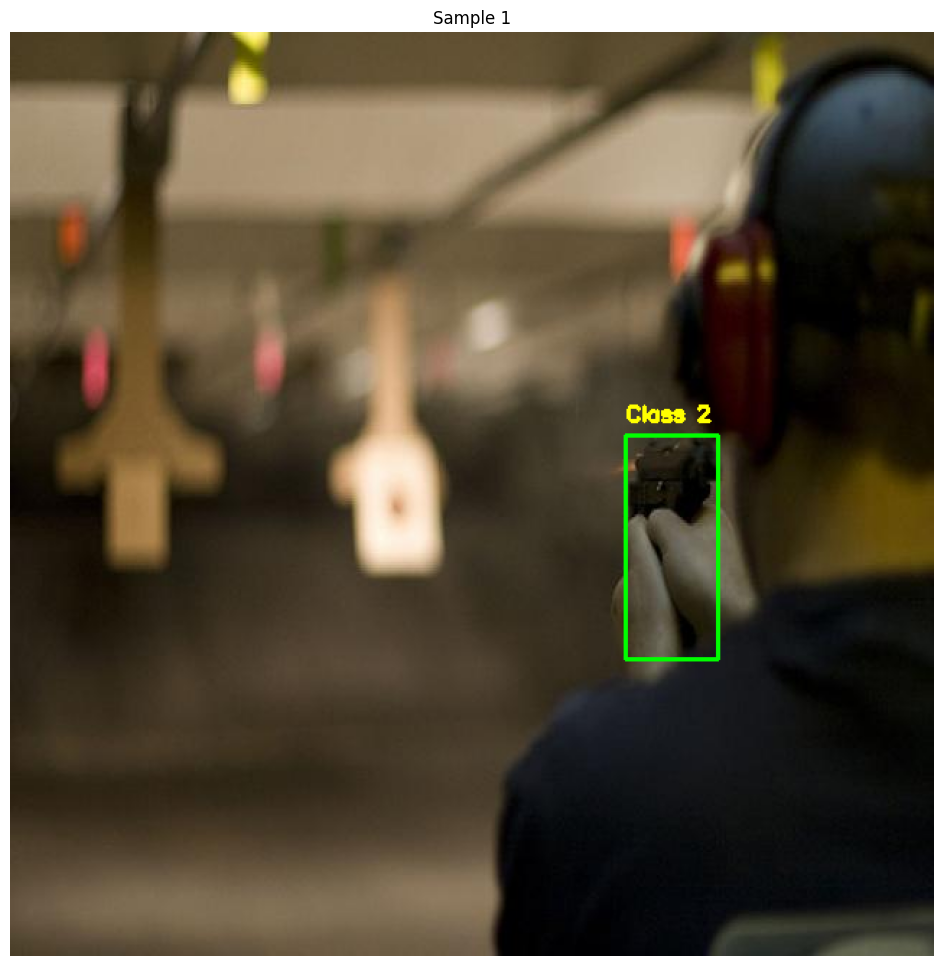

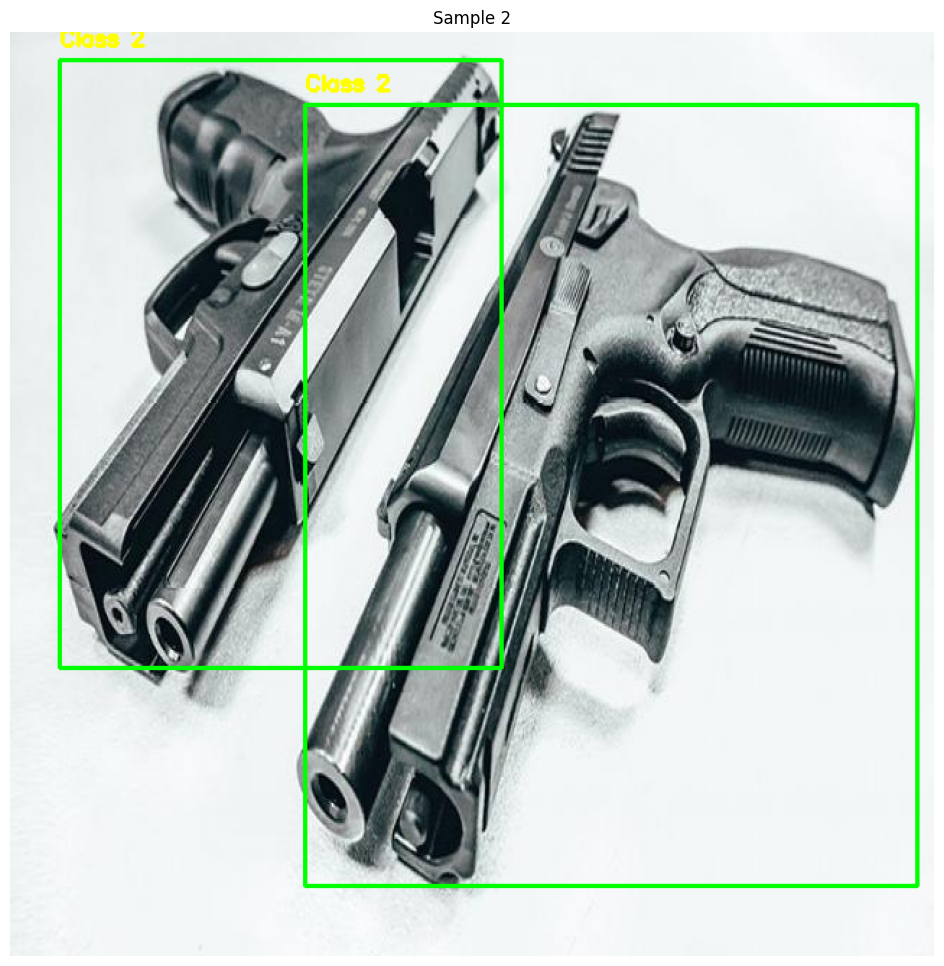

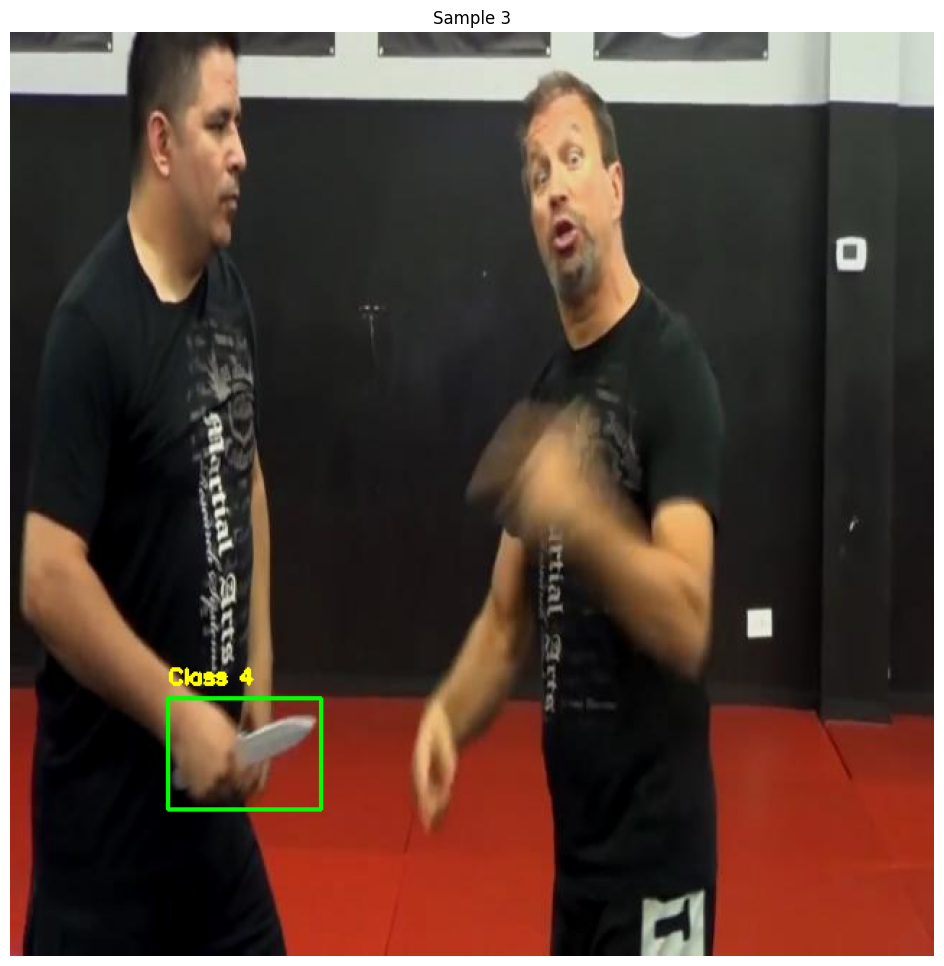

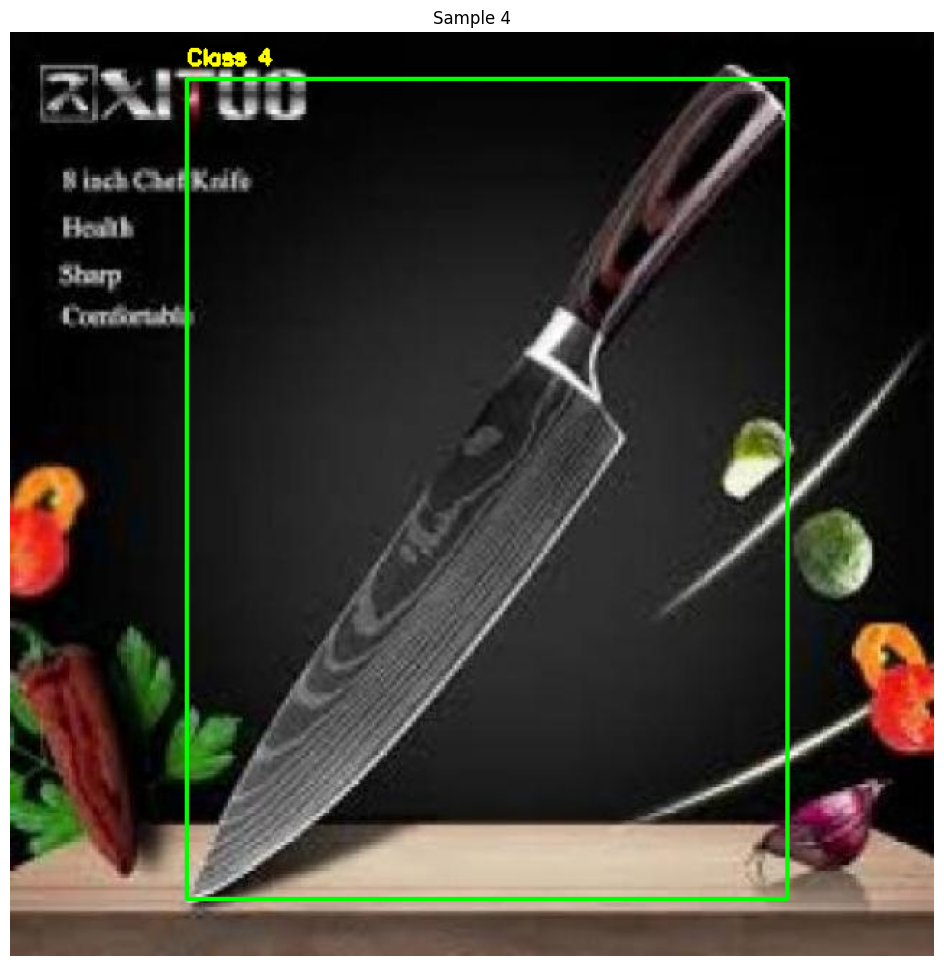

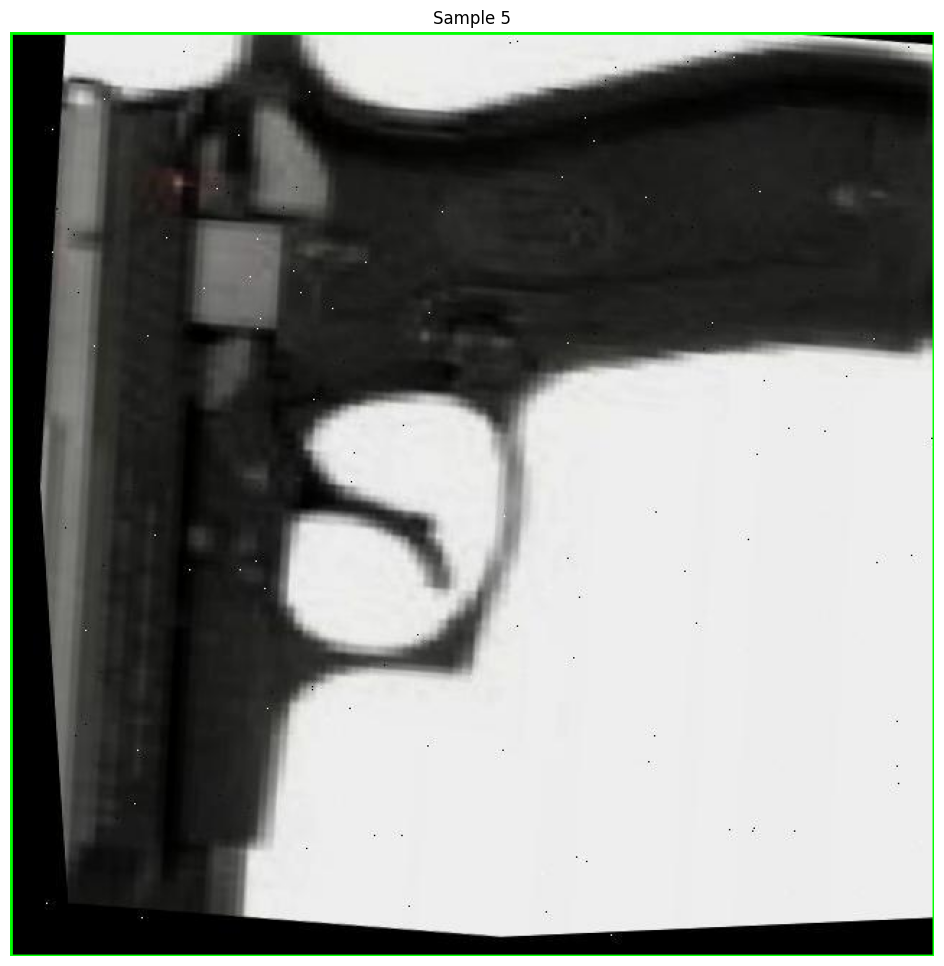

...

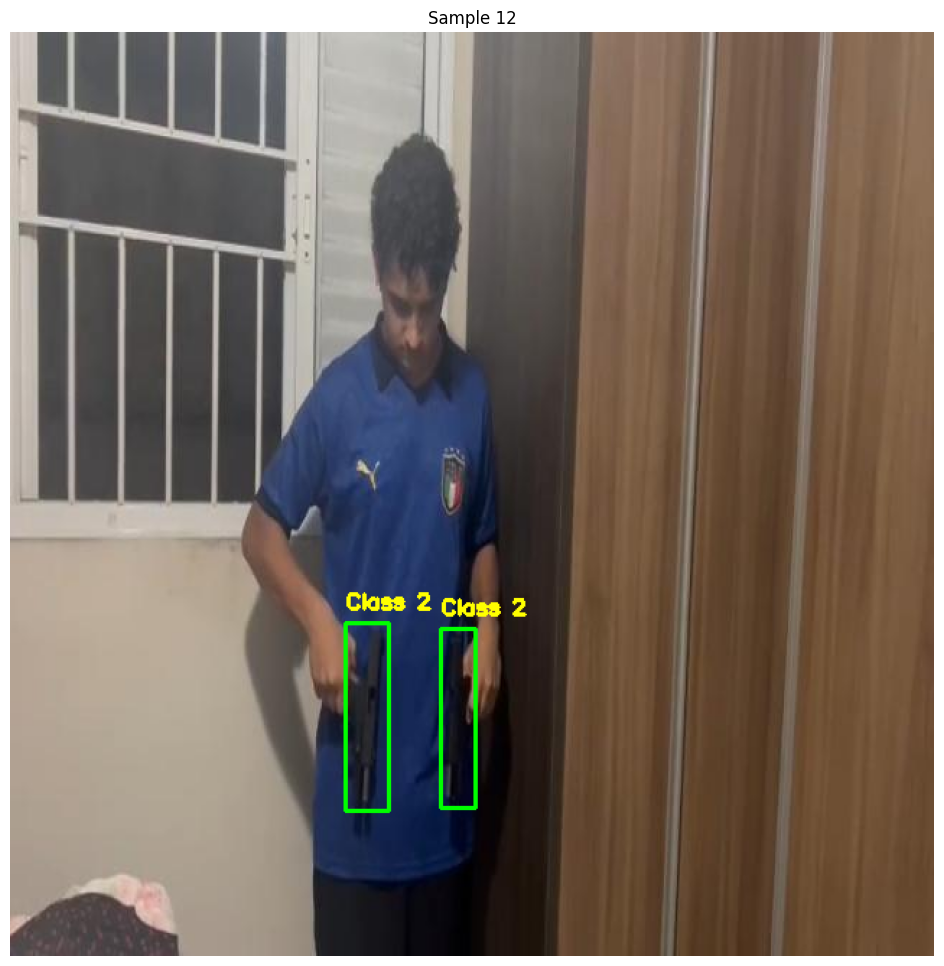

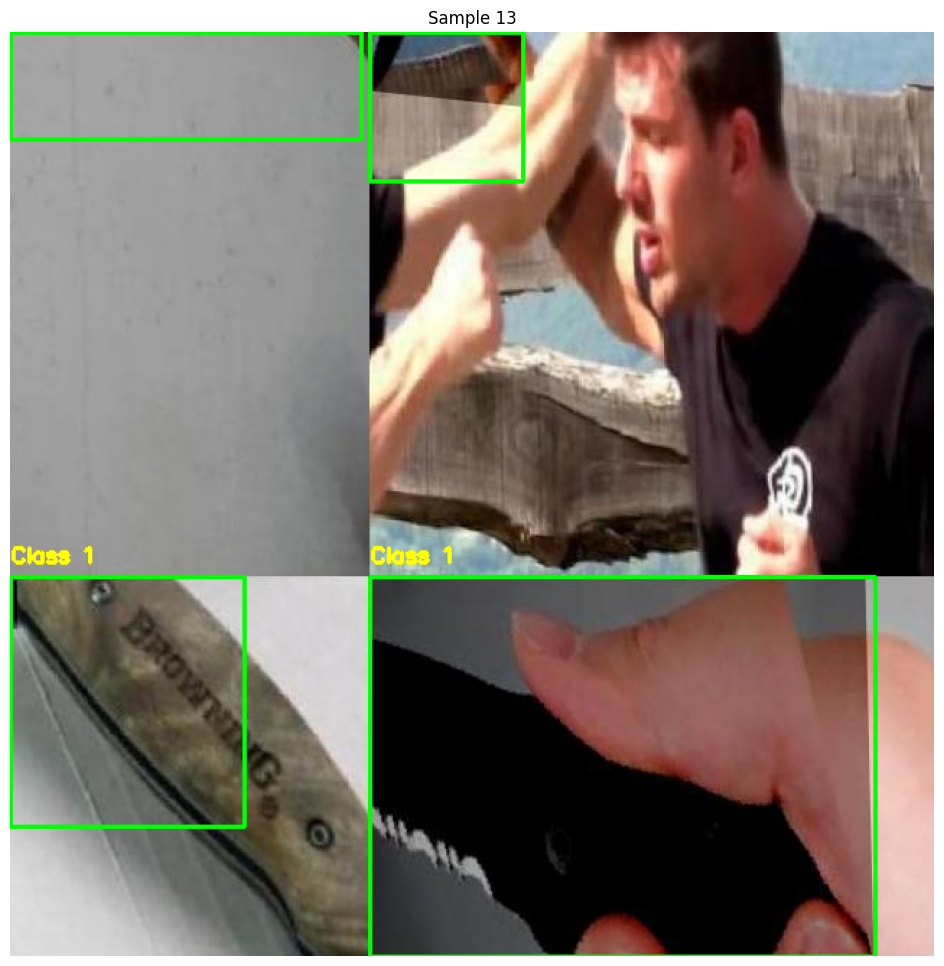

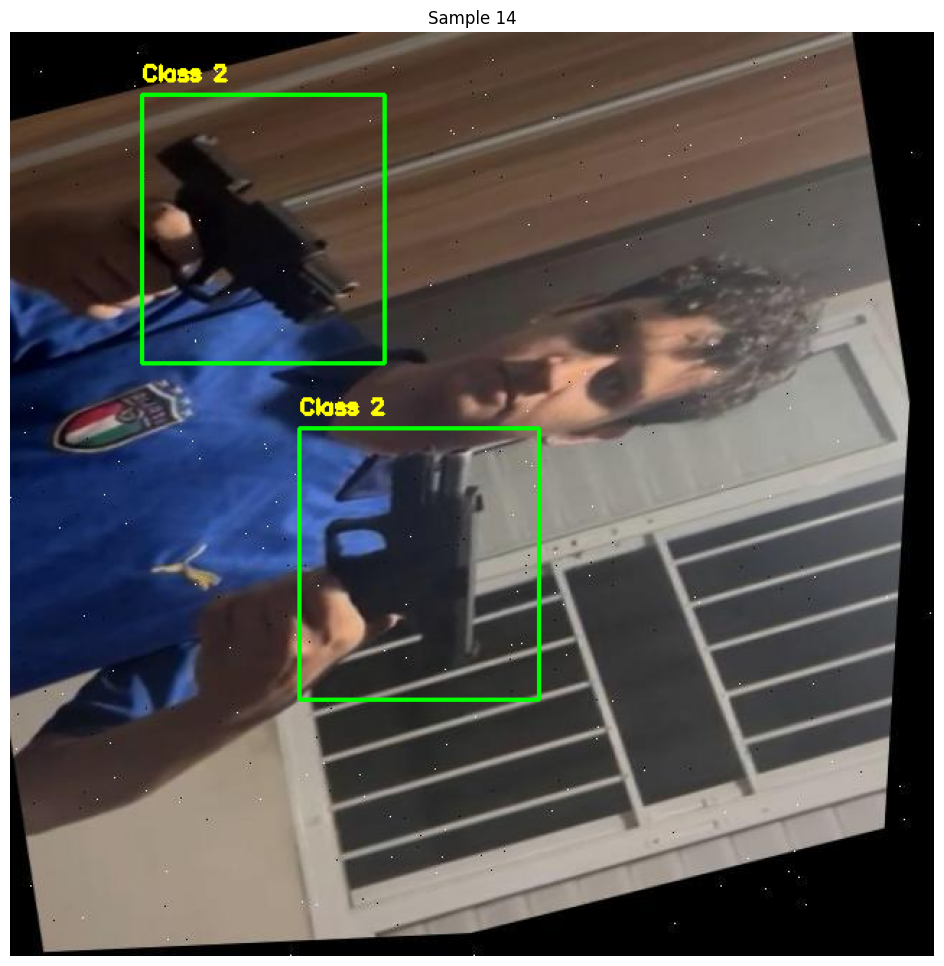

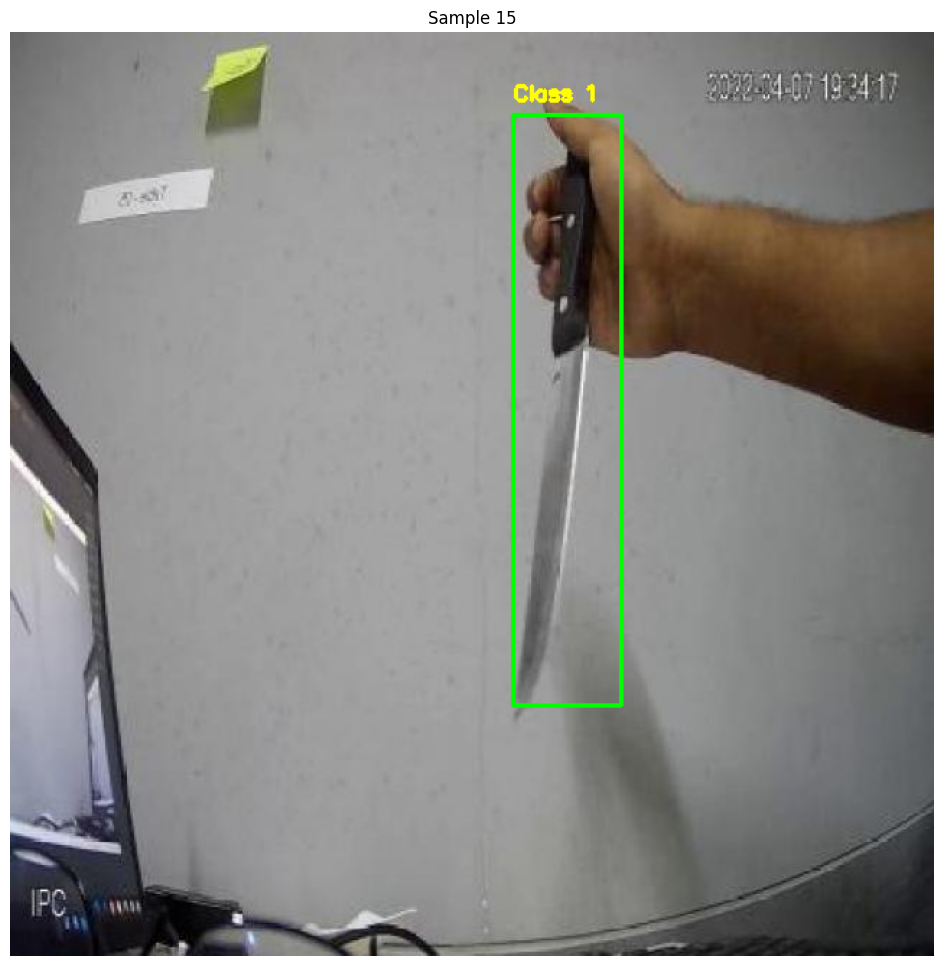

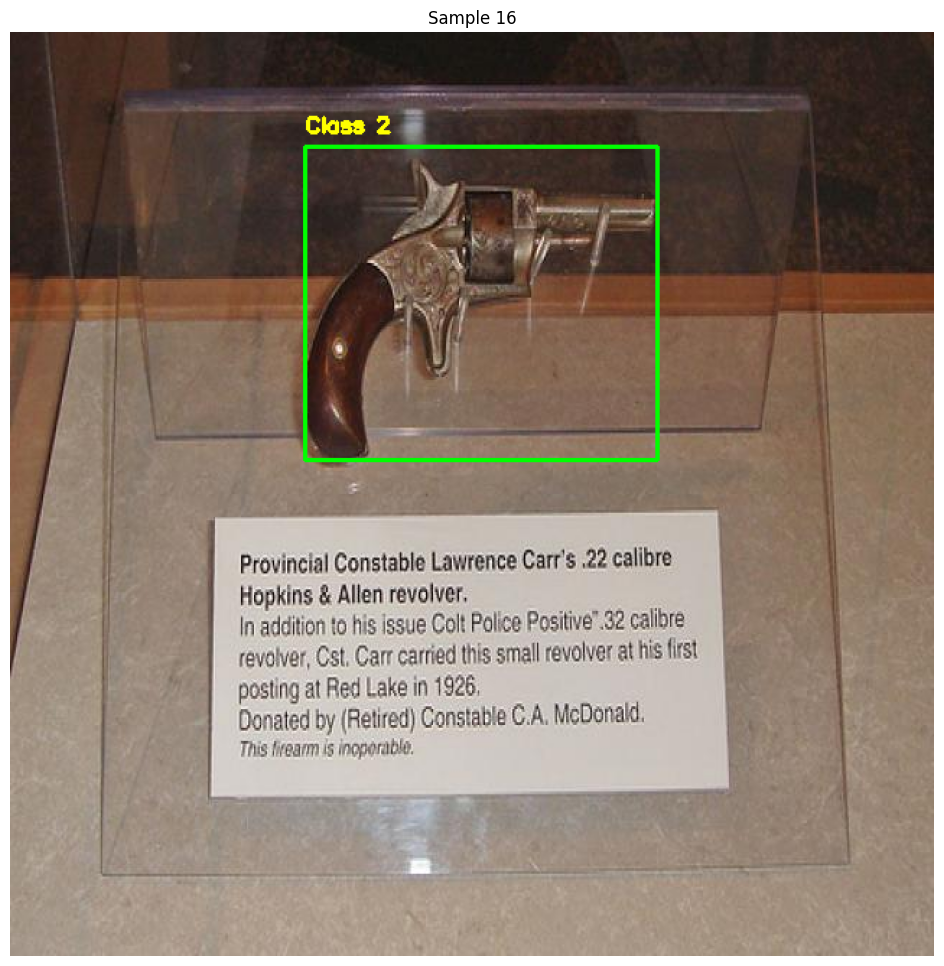

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Epoch 1/5


/tmp/ipykernel_210/512401540.py:205: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(MODEL_PATH, map_location=device)


Epoch 1 Train:   0%|          | 0/1513 [00:00<?, ?it/s]

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import torch
from PIL import Image
import numpy as np
from torch.utils.data import Dataset
from pycocotools.coco import COCO
from torch.utils.data import DataLoader
import torchvision.transforms.functional as F
from torchvision.transforms import ToTensor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision import transforms
from PIL import Image
# from engine import plot_confusion_matrix, train_one_epoch, evaluate, Args, kfold_train, plot_graph_kfold
# from feature_map import get_fpn_feature_maps, visualize_combined_features

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)


class CocoDetectionDataset(Dataset):
    # Init function: loads annotation file and prepares list of image IDs
    def __init__(self, image_dir, annotation_path, transforms=None):
        self.image_dir = image_dir
        self.coco = COCO(annotation_path)
        self.image_ids = list(self.coco.imgs.keys())
        self.transforms = transforms

    # Returns total number of images
    def __len__(self):
        return len(self.image_ids)

    # Fetches a single image and its annotations
    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = self.coco.loadImgs(image_id)[0]
        image_path = os.path.join(self.image_dir, image_info['file_name'])
        image = Image.open(image_path).convert("RGB")

        # Load all annotations for this image
        annotation_ids = self.coco.getAnnIds(imgIds=image_id)
        annotations = self.coco.loadAnns(annotation_ids)

        # Extract bounding boxes and labels from annotations
        boxes = []
        labels = []
        for obj in annotations:
            xmin, ymin, width, height = obj['bbox']
            xmax = xmin + width
            ymax = ymin + height
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(obj['category_id'])

        # Convert annotations to PyTorch tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        area = torch.as_tensor([obj['area'] for obj in annotations], dtype=torch.float32)
        iscrowd = torch.as_tensor([obj.get('iscrowd', 0) for obj in annotations], dtype=torch.int64)

        # Package everything into a target dictionary
        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        # Apply transforms if any were passed
        if self.transforms:
            image = self.transforms(image)

        return image, target

# Returns a simple transform that converts a PIL image to a PyTorch tensor
def get_transform():
    return ToTensor()

# Load training dataset with transform applied
train_dataset = CocoDetectionDataset(
    image_dir="/kaggle/input/weapon-coco-format/train",
    annotation_path="/kaggle/input/weapon-coco-format/train/_annotations.coco.json",
    # image_dir="train", 
    # annotation_path="train/_annotations.coco.json",
    transforms=get_transform()
)

# Load validation dataset with same transform
val_dataset = CocoDetectionDataset(
    image_dir="/kaggle/input/weapon-coco-format/valid",
    annotation_path="/kaggle/input/weapon-coco-format/valid/_annotations.coco.json",
    # image_dir="valid",
    # annotation_path="valid/_annotations.coco.json",
    transforms=get_transform()
)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Get one batch from the DataLoader
images, targets = next(iter(train_loader))

# Convert PIL Image and draw annotations
for i in range(len(images)):
    image = images[i].permute(1, 2, 0).numpy()  # Convert from CxHxW to HxWxC
    image = (image * 255).astype(np.uint8)  # Rescale
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    boxes = targets[i]['boxes']
    labels = targets[i]['labels']

    for box, label in zip(boxes, labels):
        x1, y1, x2, y2 = map(int, box.tolist())
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f"Class {label.item()}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Show image with boxes using matplotlib
    plt.figure(figsize=(16, 12))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Sample {i + 1}")
    plt.show()

def censor_harmful_objects(model, image_path, label_list, threshold=0.5):
    # Load and preprocess image
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        raise FileNotFoundError(f"Image not found: {image_path}")
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image_rgb)
    image_tensor = transforms.ToTensor()(image_pil).unsqueeze(0)

    # Inference
    model.eval()
    with torch.no_grad():
        predictions = model(image_tensor)
    boxes = predictions[0]['boxes']
    labels = predictions[0]['labels']
    scores = predictions[0]['scores']

    # Blur detected objects
    censored_img = image_rgb.copy()
    for i in range(len(boxes)):
        if scores[i] > threshold:
            box = boxes[i].cpu().numpy().astype(int)
            x1, y1, x2, y2 = box
            roi = censored_img[y1:y2, x1:x2]
            if roi.size > 0:
                blurred_roi = cv2.GaussianBlur(roi, (51, 51), 0)
                censored_img[y1:y2, x1:x2] = blurred_roi

    # Display results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(censored_img)
    plt.title('Censored Image')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    return censored_img


# Load a pre-trained Faster R-CNN model with ResNet50 backbone and FPN
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained='weights')

# Get the number of classes in the dataset (including background)
num_classes = len(train_dataset.coco.getCatIds()) + 1  # +1 for background class

# Get the number of input features for the classifier head
in_features = model.roi_heads.box_predictor.cls_score.in_features


model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
num_epochs = 5
TRAIN=1
EVAL=1
K_FOLD=1
F_MAP=1
MODEL_PATH = '/kaggle/input/model-trained/pytorch/default/1/model_trined.pth'
CLASS_NAMES_FULL_CORRECTED = ['Background/FN'] + ['gun-knife', '-', 'gun', 'gun-knife thesis', 'knife']
MATRIX_SIZE = len(CLASS_NAMES_FULL_CORRECTED) # Should be 6
initial_cm_data = np.zeros((MATRIX_SIZE, MATRIX_SIZE), dtype=np.int32)
feature_maps_dict = {}

if TRAIN:
    if os.path.exists(MODEL_PATH):
        state_dict = torch.load(MODEL_PATH, map_location=device)
        model.load_state_dict(state_dict)

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=25)
    torch.save(model.state_dict(), f"/kaggle/working/model_trined_final.pth")
    print(f"\nModel saved to /kaggle/working/model_trined_final.pth")
if EVAL:
    if not TRAIN: 
        if os.path.exists(MODEL_PATH):
            state_dict = torch.load(MODEL_PATH, map_location=device)
            model.load_state_dict(state_dict)
            print(f"\nModel weights loaded from {MODEL_PATH} for evaluation.")
        else:
            print("\n🚨 WARNING: No trained model found to evaluate and TRAIN is set to 0. Evaluating untrained model.")
    
    print("\n--- Starting Final Evaluation ---")
    _, confusion_matrix_data = run_evaluation(
    model=model, 
    data_loader=val_loader, 
    device=device,
    initial_cm=initial_cm_data # ADDED ARGUMENT
)

    print("\n--- Plotting Confusion Matrix ---")

    print(f"Data Type of Confusion Matrix: {type(confusion_matrix_data)}")
    if isinstance(confusion_matrix_data, np.ndarray):
        print(f"NumPy Dtype: {confusion_matrix_data.dtype}")
        print(f"NumPy Shape: {confusion_matrix_data.shape}")

    raw_title = 'Raw Confusion Matrix (Detections at IoU=0.5)'
    plot_confusion_matrix(
        cm=confusion_matrix_data,
        class_names=CLASS_NAMES_FULL_CORRECTED,
        normalize=False,
        title=raw_title,
        save_filename='raw_confusion_matrix.png' # <--- Pass the filename here
    )

    # Normalized Matrix Plot
    normalized_title = 'Normalized Confusion Matrix (Recall by Row)'
    plot_confusion_matrix(
        cm=confusion_matrix_data,
        class_names=CLASS_NAMES_FULL_CORRECTED,
        normalize=True,
        title=normalized_title,
        save_filename='normalized_confusion_matrix.png' # <--- Pass the filename here
    )
    
if K_FOLD:
    args = Args()
    print(f"Starting {args.k_folds}-Fold Cross-Validation...")
    kfold_results_dict = kfold_train(args=args, model=model, dataset=val_dataset)
    plot_graph_kfold(kfold_results_dict)
    # Plot Learning Rate
    plot_learning_rate_all_folds(kfold_results_dict)
    # Plot Training Loss
    plot_loss_history_all_folds(kfold_results_dict)

if F_MAP:
    random_idx = random.randint(0, len(train_dataset) - 1)
    raw_image_tensor, target = train_dataset[random_idx]
    raw_image_tensor = raw_image_tensor.to(device)

    original_h_w = raw_image_tensor.shape[1], raw_image_tensor.shape[2]
    selected_image_id = train_dataset.image_ids[random_idx]
    print(f"\n--- Feature Map Extraction for Image ID: {selected_image_id} ---")

    image_to_plot = F.to_pil_image(raw_image_tensor.cpu())
    image_to_plot = np.array(image_to_plot)

    target_cat_for_cam = None
    if target['labels'].numel() > 0:
        target_cat_for_cam = target['labels'][0].item() # Use the first detected label as target

    output_dir = "/kaggle/working/feature_cam_visualizations"
    
    visualize_combined_features(
        model=model,
        raw_image_tensor=raw_image_tensor,
        original_image_shape=original_h_w,
        image_array_rgb=image_to_plot,
        target_category_for_cam=target_cat_for_cam, # Pass the target category
        save_path=output_dir,
        image_id=selected_image_id
    )

# # Usage example
# image_path = r"./test/WhatsApp-Video-2023-11-22-at-19_47_53_mp4-803_jpg.rf.1259650c115c7fdb42d58248b99a9a36.jpg"
# censored_result = censor_harmful_objects(model, image_path, threshold=0.5)